In [1]:
import os
import torch 
import torchvision
import torch.nn as nn
import torchvision.transforms as transforms
import torch.optim as optim
import matplotlib.pyplot as plt
import torch.nn.functional as F
from torchvision import datasets
from torch.utils.data import DataLoader
from torchvision.utils import save_image
from PIL import Image

Epochs = 100
Lr_Rate = 1e-3
Batch_Size = 128

In [2]:
transform = transforms.Compose([
    transforms.ToTensor(),
    #transforms.Normalize((0.5,), (0.5,))
])

def get_device():
    if torch.cuda.is_available():
        device = 'cuda:0'
    else:
        device = 'cpu'
    return device

In [3]:
TRAIN_PATH ='/home/raysamram/DATASETS/CLASSIF_BIGGEST_SQUARE/train'
VAL_PATH ='/home/raysamram/DATASETS/CLASSIF_BIGGEST_SQUARE/val'



train_set = datasets.ImageFolder(root=TRAIN_PATH, transform=transform)
test_set = datasets.ImageFolder(root=VAL_PATH, transform=transform)

train_loader = DataLoader(train_set, batch_size=1, shuffle=True)
test_loader = DataLoader(test_set, batch_size=1, shuffle=True)




In [4]:
class AutoEncoder(nn.Module):
    def __init__(self,
                num_input_channels : int,
                 base_channel_size : int,
                 latent_dim : int,
                 act_fn : object = nn.GELU):
                
        super(AutoEncoder, self).__init__()
        c_hid = base_channel_size
        self.encoder = nn.Sequential(
            nn.Conv2d(num_input_channels, c_hid, kernel_size=3, padding=1, stride=2), # 256x256 => 128x128
            act_fn(),
            nn.Conv2d(c_hid, c_hid, kernel_size=3, padding=1),
            act_fn(),
            nn.Conv2d(c_hid, c_hid, kernel_size=3, padding=1, stride=2), # 128x128 => 64x64
            act_fn(),
            nn.Conv2d(c_hid, c_hid, kernel_size=3, padding=1),
            act_fn(),
            nn.Conv2d(c_hid, c_hid, kernel_size=3, padding=1, stride=2), # 64x64 => 32x32
            act_fn(),
            nn.Conv2d(c_hid, 2*c_hid, kernel_size=3, padding=1),
            act_fn(),
            nn.Conv2d(2*c_hid, 2*c_hid, kernel_size=3, padding=1, stride=2), # 32x32 => 16x16
            act_fn(),
            nn.Conv2d(2*c_hid, 2*c_hid, kernel_size=3, padding=1),
            act_fn(),
            nn.Conv2d(2*c_hid, 2*c_hid, kernel_size=3, padding=1, stride=2), # 16x16 => 8x8
            act_fn(),
            nn.Conv2d(2*c_hid, 2*c_hid, kernel_size=3, padding=1),
            act_fn(),
            nn.Conv2d(2*c_hid, 2*c_hid, kernel_size=3, padding=1, stride=2), # 8x8 => 4x4
            act_fn(),
            nn.Flatten(), # Image grid to single feature vector
            nn.Linear(2*16*c_hid, latent_dim)
            )
        
        self.linear = nn.Sequential(
            nn.Linear(latent_dim, 2*16*c_hid),
            act_fn()
        )
        self.decoder = nn.Sequential(
            nn.ConvTranspose2d(2*c_hid, 2*c_hid, kernel_size=3, output_padding=1, padding=1, stride=2), # 4x4 => 8x8
            act_fn(),
            nn.Conv2d(2*c_hid, 2*c_hid, kernel_size=3, padding=1),
            act_fn(),
            nn.ConvTranspose2d(2*c_hid, 2*c_hid, kernel_size=3, output_padding=1, padding=1, stride=2), # 8x8 => 16x16
            act_fn(),
            nn.Conv2d(2*c_hid, 2*c_hid, kernel_size=3, padding=1),
            act_fn(),
            nn.ConvTranspose2d(2*c_hid, c_hid, kernel_size=3, output_padding=1, padding=1, stride=2), # 16x16 => 32x32
            act_fn(),
            nn.Conv2d(c_hid, c_hid, kernel_size=3, padding=1),
            act_fn(),
            nn.ConvTranspose2d(c_hid, c_hid, kernel_size=3, output_padding=1, padding=1, stride=2), # 32x32 => 64x64
            act_fn(),
            nn.Conv2d(c_hid, c_hid, kernel_size=3, padding=1),
            act_fn(),
            nn.ConvTranspose2d(c_hid, c_hid, kernel_size=3, output_padding=1, padding=1, stride=2), # 64x64 => 128x128
            act_fn(),
            nn.Conv2d(c_hid, c_hid, kernel_size=3, padding=1),
            act_fn(),
            nn.ConvTranspose2d(c_hid, num_input_channels, kernel_size=3, output_padding=1, padding=1, stride=2), # 128x128 => 256x256
            nn.Tanh() # The input images is scaled between -1 and 1, hence the output has to be bounded as well
        )

    def forward(self, x):
        x = self.encoder(x)
        x = self.linear(x)
        x = x.reshape(x.shape[0], -1, 4, 4)
        x = self.decoder(x)
        return x
    
    
class SimpleAutoEncoder(nn.Module):
    def __init__(self):
        super(SimpleAutoEncoder, self).__init__()
        ## encoder layers ##
        # conv layer (depth from 3 --> 16), 3x3 kernels
        self.conv1 = nn.Conv2d(3, 128, 3, padding=1)  
        # conv layer (depth from 16 --> 4), 3x3 kernels
        self.conv2 = nn.Conv2d(128, 64, 3, padding=1)
        self.conv3 = nn.Conv2d(64, 32, 3, padding=1)  
        self.conv4 = nn.Conv2d(32, 16, 3, padding=1)  
        self.conv5 = nn.Conv2d(16, 8, 3, padding=1)

        # pooling layer to reduce x-y dims by two; kernel and stride of 2
        self.pool = nn.MaxPool2d(2, 2)
        
        ## decoder layers ##
        ## a kernel of 2 and a stride of 2 will increase the spatial dims by 2
        self.flat = nn.Flatten()
        self.t_conv1 = nn.ConvTranspose2d(8, 16, 2, stride=2)
        self.t_conv2 = nn.ConvTranspose2d(16, 32, 2, stride=2)
        self.t_conv3 = nn.ConvTranspose2d(32, 64, 2, stride=2)
        self.t_conv4 = nn.ConvTranspose2d(64, 128, 2, stride=2)
        self.t_conv5 = nn.ConvTranspose2d(128, 3, 2, stride=2)

    def forward(self, x):
        ## encode ##
        # add hidden layers with relu activation function
        # and maxpooling after
        x = F.relu(self.conv1(x))
        x = self.pool(x)
        # add second hidden layer
        x = F.relu(self.conv2(x))
        x = self.pool(x)  # compressed representation
        x = F.relu(self.conv3(x))
        x = self.pool(x)
        x = F.relu(self.conv4(x))
        x = self.pool(x)
        x = F.relu(self.conv5(x))
        x = self.pool(x)

        #print("x shape : "+str(x.shape))
        ## decode ##
        # add transpose conv layers, with relu activation function
        x = F.relu(self.t_conv1(x))
        x = F.relu(self.t_conv2(x))
        x = F.relu(self.t_conv3(x))
        x = F.relu(self.t_conv4(x))

        # output layer (with sigmoid for scaling from 0 to 1)
        x = F.sigmoid(self.t_conv5(x))
                
        return x
    
    def compress(self, x):
        x = F.relu(self.conv1(x))
        x = self.pool(x)
        # add second hidden layer
        x = F.relu(self.conv2(x))
        x = self.pool(x)  # compressed representation
        x = F.relu(self.conv3(x))
        x = self.pool(x)
        x = F.relu(self.conv4(x))
        x = self.pool(x)
        x = F.relu(self.conv5(x))
        x = self.pool(x)
        x = self.flat(x)
        return x

SimpleAutoEncoder(
  (conv1): Conv2d(3, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv2): Conv2d(128, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv3): Conv2d(64, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv4): Conv2d(32, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv5): Conv2d(16, 8, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (pool): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (flat): Flatten(start_dim=1, end_dim=-1)
  (t_conv1): ConvTranspose2d(8, 16, kernel_size=(2, 2), stride=(2, 2))
  (t_conv2): ConvTranspose2d(16, 32, kernel_size=(2, 2), stride=(2, 2))
  (t_conv3): ConvTranspose2d(32, 64, kernel_size=(2, 2), stride=(2, 2))
  (t_conv4): ConvTranspose2d(64, 128, kernel_size=(2, 2), stride=(2, 2))
  (t_conv5): ConvTranspose2d(128, 3, kernel_size=(2, 2), stride=(2, 2))
)
Epoch 1 of 100, Train Loss: 70548.194
to save img size : torch.Size([1, 3, 256, 256])
saved img size : tor

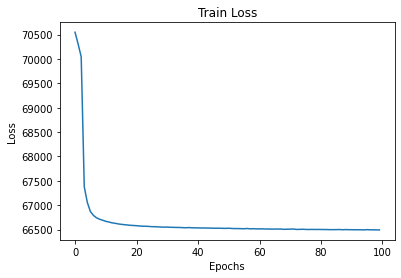

In [97]:
def test_image_reconstruct(model, test_loader):
     for batch in test_loader:
        img, _ = batch
        img = img.to(device)
        #img = img.view(img.size(0), -1)
        outputs = model(img)
        outputs = outputs.view(256, 256, 3).cpu().data
        save_image(outputs, 'reconstruction.png')
        break

        
        

def save_decod_img(img, epoch):
    print("to save img size : "+str(img.shape))
    #img = img.view(256, 256, 3)
    img = img[0]
    print("saved img size : "+str(img.shape))
    save_image(img, 'Autoencoder_image{}.png'.format(epoch))
    
def make_dir():
    image_dir = 'MNIST_Out_Images'
    if not os.path.exists(image_dir):
        os.makedirs(image_dir)
    
def training(model, train_loader, Epochs):
    train_loss = []
    for epoch in range(Epochs):
        running_loss = 0.0
        for data in train_loader:
            img, _ = data
            img = img.to(device)
            #img = img.view(img.size(0), 3, -1)
            optimizer.zero_grad()
            
            x_hat = model.forward(img).to(device)
            """
            print("img shape : "+str(img.shape))
            print("x_hat shape : "+str(x_hat.shape))
            """
            loss = F.mse_loss(img, x_hat, reduction="none")
            loss = loss.sum(dim=[1,2,3]).mean(dim=[0])
            
            """
            outputs = model(img)
            loss = criterion(outputs, img)
            """
            loss.backward()
            optimizer.step()
            running_loss += loss.item()

        loss = running_loss / len(train_loader)
        train_loss.append(loss)
        print('Epoch {} of {}, Train Loss: {:.3f}'.format(
            epoch+1, Epochs, loss))

        if epoch % 5 == 0:
            save_decod_img(x_hat.cpu().data, epoch)

    return train_loss

num_input_channels = 3 
base_channel_size = 24
latent_dim = 64
#model = AutoEncoder(num_input_channels, base_channel_size, latent_dim)
model = SimpleAutoEncoder()
print(model)


criterion = nn.BCELoss()
optimizer = optim.Adam(model.parameters(), lr=0.001)
scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer,
                                                         mode='min',
                                                         factor=0.2,
                                                         patience=20,
                                                         min_lr=5e-5)


device = get_device()
model.to(device)
make_dir()

train_loss = training(model, train_loader, Epochs)

plt.figure()
plt.plot(train_loss)
plt.title('Train Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.savefig('deep_ae_mnist_loss.png')


In [ ]:
n_epochs = 100

for epoch in range(1, n_epochs+1):
    # monitor training loss
    train_loss = 0.0
    
    ###################
    # train the model #
    ###################
    for data in train_loader:
        # _ stands in for labels, here
        # no need to flatten images
        images, _ = data
        # clear the gradients of all optimized variables
        optimizer.zero_grad()
        # forward pass: compute predicted outputs by passing inputs to the model
        outputs = model(images)
        # calculate the loss
        loss = criterion(outputs, images)
        # backward pass: compute gradient of the loss with respect to model parameters
        loss.backward()
        # perform a single optimization step (parameter update)
        optimizer.step()
        # update running training loss
        train_loss += loss.item()*images.size(0)
            
    # print avg training statistics 
    train_loss = train_loss/len(train_loader)
    print('Epoch: {} \tTraining Loss: {:.6f}'.format(
        epoch, 
        train_loss
        ))

In [98]:
PATH = "autoencoder.model"
torch.save(model, PATH)

In [5]:
PATH = "autoencoder.model"
device = "cpu"

model = torch.load(PATH).to(device)
model.eval()

SimpleAutoEncoder(
  (conv1): Conv2d(3, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv2): Conv2d(128, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv3): Conv2d(64, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv4): Conv2d(32, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv5): Conv2d(16, 8, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (pool): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (flat): Flatten(start_dim=1, end_dim=-1)
  (t_conv1): ConvTranspose2d(8, 16, kernel_size=(2, 2), stride=(2, 2))
  (t_conv2): ConvTranspose2d(16, 32, kernel_size=(2, 2), stride=(2, 2))
  (t_conv3): ConvTranspose2d(32, 64, kernel_size=(2, 2), stride=(2, 2))
  (t_conv4): ConvTranspose2d(64, 128, kernel_size=(2, 2), stride=(2, 2))
  (t_conv5): ConvTranspose2d(128, 3, kernel_size=(2, 2), stride=(2, 2))
)

In [6]:
img,label = next(iter(train_loader))
print(batch)
yhat = model(img) # Give dummy batch to forward().

from torchviz import make_dot
make_dot(yhat, params=dict(list(model.named_parameters())),  show_attrs=False, show_saved=False).render("deep_auto_encoder_torchviz", format="png")

NameError: name 'batch' is not defined

In [8]:
model.to(device)
representations = []
labels = []
cnt = 0
for data in test_loader:
    print(" cnt "+str(cnt))
    #torch.cuda.empty_cache()
    image, label = data
    
    labels.append(label)
    rep = model.compress(image.to(device))[0].data.numpy()
    print("rep shape : "+str(rep.shape))
    representations.append(rep)
    del image, label, rep
    cnt += 1

 cnt 0
rep shape : (512,)
 cnt 1
rep shape : (512,)
 cnt 2
rep shape : (512,)
 cnt 3
rep shape : (512,)
 cnt 4


/home/raysamram/miniconda3/lib/python3.8/site-packages/torch/nn/functional.py:718: UserWarning: Named tensors and all their associated APIs are an experimental feature and subject to change. Please do not use them for anything important until they are released as stable. (Triggered internally at  /pytorch/c10/core/TensorImpl.h:1156.)
  return torch.max_pool2d(input, kernel_size, stride, padding, dilation, ceil_mode)


rep shape : (512,)
 cnt 5
rep shape : (512,)
 cnt 6
rep shape : (512,)
 cnt 7
rep shape : (512,)
 cnt 8
rep shape : (512,)
 cnt 9
rep shape : (512,)
 cnt 10
rep shape : (512,)
 cnt 11
rep shape : (512,)
 cnt 12
rep shape : (512,)
 cnt 13
rep shape : (512,)
 cnt 14
rep shape : (512,)
 cnt 15
rep shape : (512,)
 cnt 16
rep shape : (512,)
 cnt 17
rep shape : (512,)
 cnt 18
rep shape : (512,)
 cnt 19
rep shape : (512,)
 cnt 20
rep shape : (512,)
 cnt 21
rep shape : (512,)
 cnt 22
rep shape : (512,)
 cnt 23
rep shape : (512,)
 cnt 24
rep shape : (512,)
 cnt 25
rep shape : (512,)
 cnt 26
rep shape : (512,)
 cnt 27
rep shape : (512,)
 cnt 28
rep shape : (512,)
 cnt 29
rep shape : (512,)
 cnt 30
rep shape : (512,)
 cnt 31
rep shape : (512,)
 cnt 32
rep shape : (512,)
 cnt 33
rep shape : (512,)
 cnt 34
rep shape : (512,)
 cnt 35
rep shape : (512,)
 cnt 36
rep shape : (512,)
 cnt 37
rep shape : (512,)
 cnt 38
rep shape : (512,)
 cnt 39
rep shape : (512,)
 cnt 40
rep shape : (512,)
 cnt 41
rep sh

In [9]:
import numpy as np

representations = np.array(representations)
representations.shape

(4368, 512)

In [10]:
labels = np.array(labels)
labels.shape

/tmp/ipykernel_968/1380475717.py:1: FutureWarning: The input object of type 'Tensor' is an array-like implementing one of the corresponding protocols (`__array__`, `__array_interface__` or `__array_struct__`); but not a sequence (or 0-D). In the future, this object will be coerced as if it was first converted using `np.array(obj)`. To retain the old behaviour, you have to either modify the type 'Tensor', or assign to an empty array created with `np.empty(correct_shape, dtype=object)`.
  labels = np.array(labels)
/tmp/ipykernel_968/1380475717.py:1: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  labels = np.array(labels)


(4368,)

In [16]:
from sklearn.cluster import KMeans
from sklearn.cluster import DBSCAN
from sklearn.cluster import Birch, OPTICS
from sklearn.mixture import GaussianMixture 
kmeans = KMeans(n_clusters=5, random_state=30)
#kmeans = DBSCAN()
#kmeans = Birch(threshold=0.01, n_clusters=5)
#kmeans = GaussianMixture(n_components=5)
#kmeans = OPTICS(min_samples=50, xi=.05, min_cluster_size=.05)
#clusters = kmeans.fit_transform(representations.astype('double'))
clusters = kmeans.fit_predict(representations.astype('double'))

In [17]:
print(kmeans.labels_)
labs = kmeans.labels_

[1 0 3 ... 0 4 2]


In [18]:
print(labels)
#print((int(labels[0])))
labels = [int(x) for x in labels]

[2, 3, 0, 4, 1, 1, 0, 0, 2, 3, 2, 1, 4, 2, 2, 3, 0, 0, 3, 3, 3, 0, 2, 3, 2, 4, 3, 4, 1, 2, 3, 4, 4, 0, 4, 3, 3, 1, 4, 3, 2, 3, 3, 3, 2, 4, 3, 3, 1, 4, 3, 0, 3, 0, 4, 3, 4, 3, 0, 4, 2, 3, 4, 0, 2, 2, 0, 4, 3, 1, 4, 0, 3, 3, 2, 2, 0, 3, 4, 4, 1, 0, 0, 0, 4, 4, 3, 3, 2, 3, 0, 0, 2, 2, 1, 2, 3, 3, 3, 1, 3, 3, 2, 1, 3, 3, 0, 0, 3, 0, 2, 0, 3, 0, 0, 1, 3, 0, 0, 4, 2, 3, 3, 0, 3, 0, 2, 3, 3, 1, 0, 0, 3, 4, 3, 1, 4, 4, 2, 3, 1, 1, 4, 2, 4, 3, 1, 3, 4, 0, 1, 3, 3, 3, 0, 4, 1, 2, 0, 4, 0, 3, 1, 4, 3, 4, 3, 3, 0, 3, 3, 0, 2, 3, 0, 2, 2, 3, 3, 1, 3, 3, 4, 2, 1, 4, 0, 3, 2, 0, 3, 3, 1, 3, 0, 1, 3, 2, 3, 4, 2, 4, 0, 3, 3, 4, 1, 3, 3, 0, 2, 2, 3, 1, 4, 1, 1, 3, 2, 3, 0, 4, 4, 0, 1, 2, 2, 1, 3, 3, 0, 3, 1, 3, 3, 2, 1, 0, 4, 3, 4, 3, 3, 0, 1, 3, 3, 2, 3, 1, 0, 2, 2, 2, 1, 2, 0, 2, 0, 0, 3, 0, 3, 0, 1, 4, 4, 1, 3, 2, 0, 0, 4, 4, 1, 4, 3, 2, 3, 3, 4, 4, 1, 3, 3, 2, 3, 3, 3, 4, 2, 0, 1, 3, 0, 0, 4, 0, 4, 4, 3, 4, 1, 1, 3, 3, 1, 0, 3, 2, 3, 0, 3, 1, 4, 4, 3, 4, 1, 1, 3, 0, 3, 1, 2, 0, 0, 3, 0, 4, 4, 1, 2, 

In [19]:
from sklearn.metrics import confusion_matrix

print(labs)
print(labels)
cfs = confusion_matrix(labels, labs)
print(cfs)

[1 0 3 ... 0 4 2]
[2, 3, 0, 4, 1, 1, 0, 0, 2, 3, 2, 1, 4, 2, 2, 3, 0, 0, 3, 3, 3, 0, 2, 3, 2, 4, 3, 4, 1, 2, 3, 4, 4, 0, 4, 3, 3, 1, 4, 3, 2, 3, 3, 3, 2, 4, 3, 3, 1, 4, 3, 0, 3, 0, 4, 3, 4, 3, 0, 4, 2, 3, 4, 0, 2, 2, 0, 4, 3, 1, 4, 0, 3, 3, 2, 2, 0, 3, 4, 4, 1, 0, 0, 0, 4, 4, 3, 3, 2, 3, 0, 0, 2, 2, 1, 2, 3, 3, 3, 1, 3, 3, 2, 1, 3, 3, 0, 0, 3, 0, 2, 0, 3, 0, 0, 1, 3, 0, 0, 4, 2, 3, 3, 0, 3, 0, 2, 3, 3, 1, 0, 0, 3, 4, 3, 1, 4, 4, 2, 3, 1, 1, 4, 2, 4, 3, 1, 3, 4, 0, 1, 3, 3, 3, 0, 4, 1, 2, 0, 4, 0, 3, 1, 4, 3, 4, 3, 3, 0, 3, 3, 0, 2, 3, 0, 2, 2, 3, 3, 1, 3, 3, 4, 2, 1, 4, 0, 3, 2, 0, 3, 3, 1, 3, 0, 1, 3, 2, 3, 4, 2, 4, 0, 3, 3, 4, 1, 3, 3, 0, 2, 2, 3, 1, 4, 1, 1, 3, 2, 3, 0, 4, 4, 0, 1, 2, 2, 1, 3, 3, 0, 3, 1, 3, 3, 2, 1, 0, 4, 3, 4, 3, 3, 0, 1, 3, 3, 2, 3, 1, 0, 2, 2, 2, 1, 2, 0, 2, 0, 0, 3, 0, 3, 0, 1, 4, 4, 1, 3, 2, 0, 0, 4, 4, 1, 4, 3, 2, 3, 3, 4, 4, 1, 3, 3, 2, 3, 3, 3, 4, 2, 0, 1, 3, 0, 0, 4, 0, 4, 4, 3, 4, 1, 1, 3, 3, 1, 0, 3, 2, 3, 0, 3, 1, 4, 4, 3, 4, 1, 1, 3, 0, 3, 1, 2, 0, 0, 

0.12199509427466958
(5, 5)
(5,)
(5, 5)


<AxesSubplot:title={'center':'Confusion Matrix Clusters MODIS model %'}>

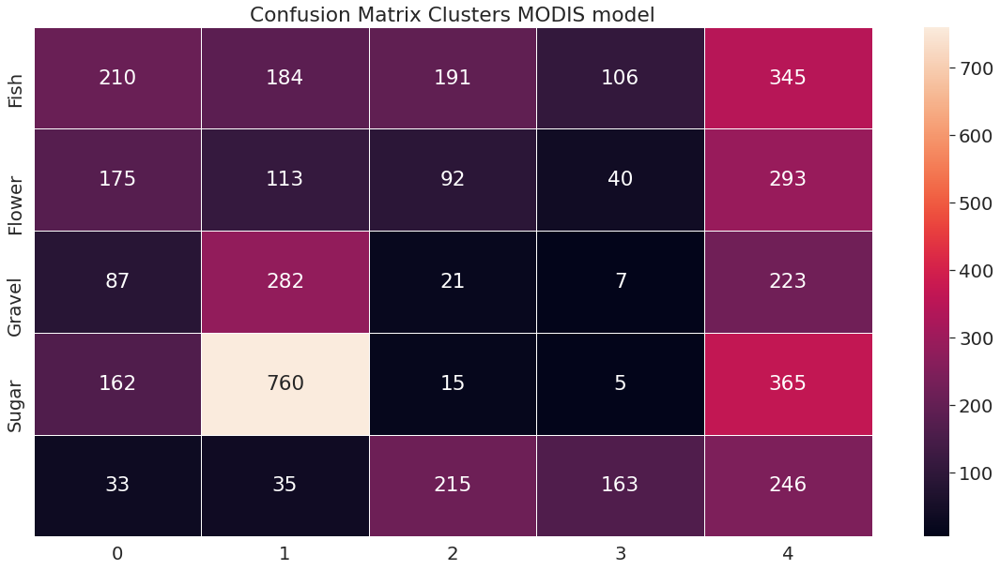

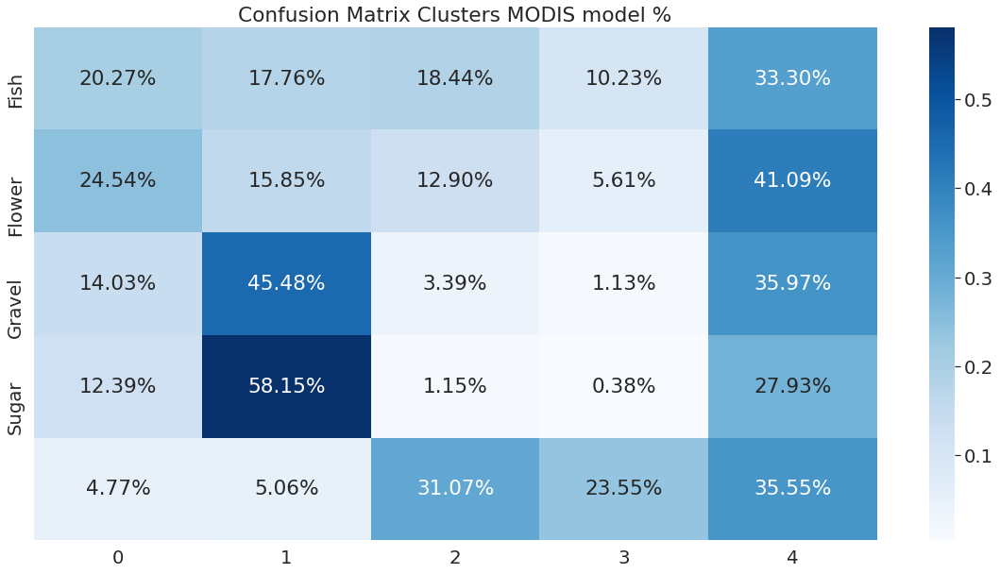

In [20]:
import seaborn as sns
from sklearn.metrics.cluster import normalized_mutual_info_score

print(normalized_mutual_info_score(labels, labs))

associations = ['Fish', 'Flower', 'Gravel', 'Sugar']
fig, ax = plt.subplots(figsize=(20,10)) 
plt.title("Confusion Matrix Clusters MODIS model")
sns.set(font_scale=1.8)
sns.heatmap(cfs, annot=True, fmt='', ax=ax, linewidths=.9, yticklabels=associations)
fig, ax = plt.subplots(figsize=(20,10))
print(cfs.shape)
print(   np.sum(  cfs, axis=1  ).shape  )
print(   (  cfs.T/np.sum(cfs, axis=1)    ).shape  )
plt.title("Confusion Matrix Clusters MODIS model %")
sns.heatmap( (cfs.T/np.sum(cfs, axis=1)).T, annot=True, 
            fmt='.2%', cmap='Blues' , yticklabels=associations)

[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4]


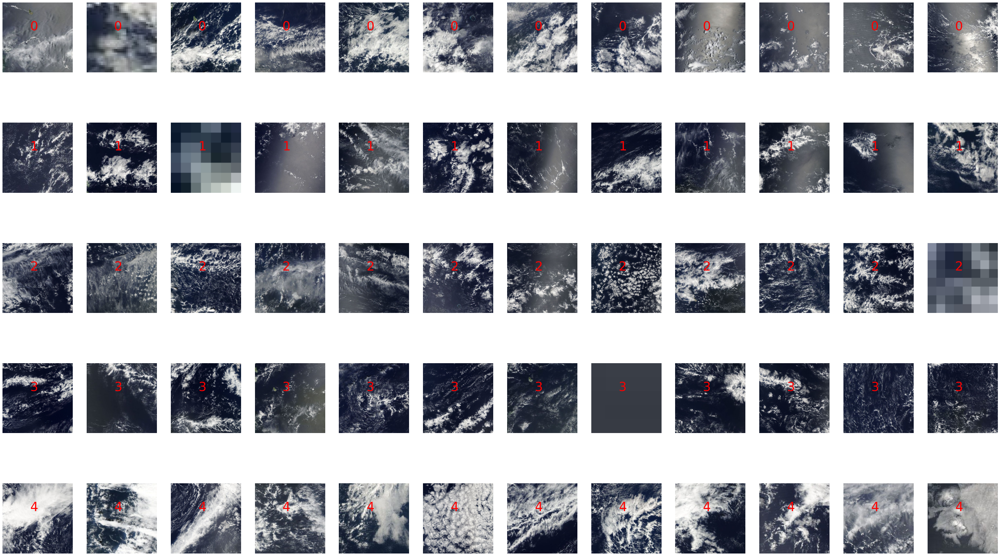

In [100]:
import matplotlib.pyplot as plt
from PIL import Image
import torchvision.transforms.functional as TF
import random
from os import listdir
from os.path import isfile, join

mypath = "/home/raysamram/DATASETS/CLUSTERING_BIGGEST_SQUARE/train"

onlyfiles = [f for f in listdir(mypath) if isfile(join(mypath, f))]
#print(onlyfiles)
w = 100
h = 100
fig = plt.figure(figsize=(50, 30))
columns = 12
rows = 5
predicted = []

#for i in range(1, columns*rows +1):
i = 0
for classe in range(5):
    img_lbl = -1
    cnt = 0
    while cnt<columns:
        index = random.choice(onlyfiles)
        img_path = mypath+"/"+index
        image = Image.open(img_path)
        x = TF.to_tensor(image).unsqueeze(0)
        #print("shape img : "+str(x.shape))
        compressed = model.compress(x)[0].data.numpy()
        compressed = np.array([compressed], dtype=np.double)
        compressed = np.array(compressed, dtype=np.double)
        #print(type(compressed))
        #print("compression shape : "+str(compressed.shape))
        #print(compressed)
        img_lbl = kmeans.predict(compressed.astype('double'))
        if img_lbl == classe:
            cnt += 1
            i += 1
            predicted.append(img_lbl[0])
            #print(img_lbl)
            fig.add_subplot(rows, columns, i)
            plt.imshow(image)
            plt.text(100, 100, str(img_lbl[0]), fontsize=35, color="red") #bbox=dict(fill=False, edgecolor='red', linewidth=2))
            plt.axis('off')
print(predicted)
fig.savefig('clustering_example.png', dpi=100)
plt.show()

(3, 256, 256)
(3, 256, 256)
(3, 256, 256)
(3, 256, 256)
(3, 256, 256)
[]


<Figure size 3600x2160 with 0 Axes>

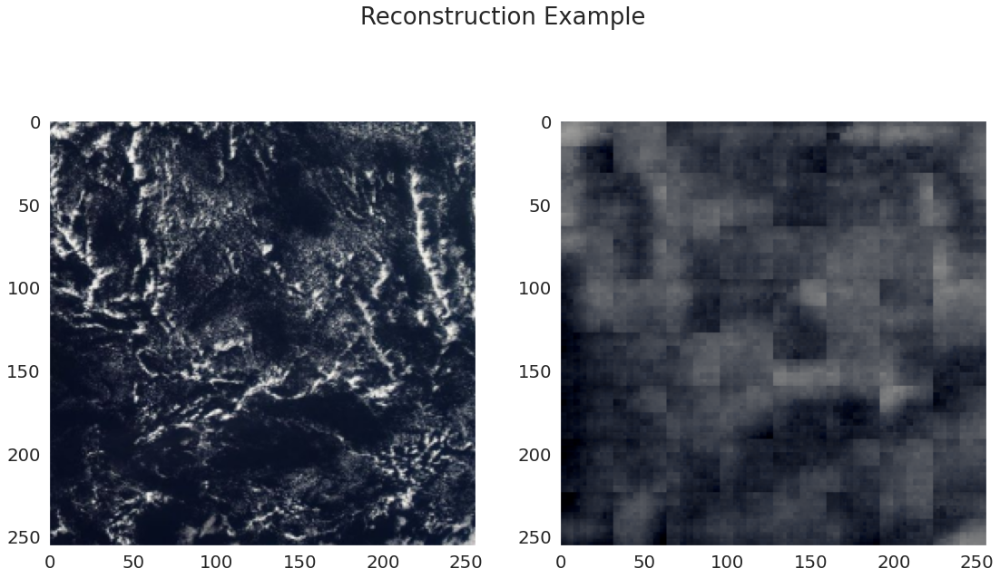

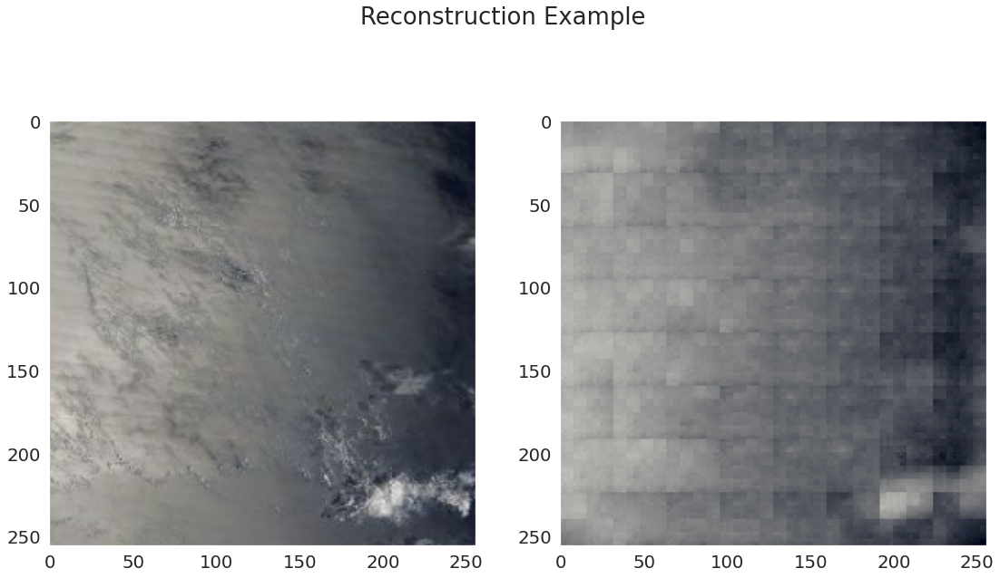

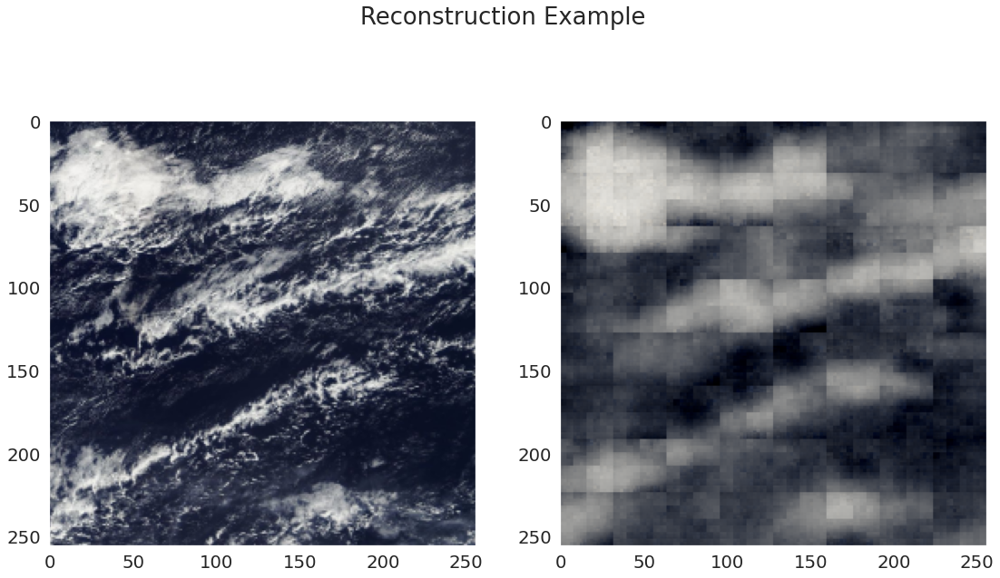

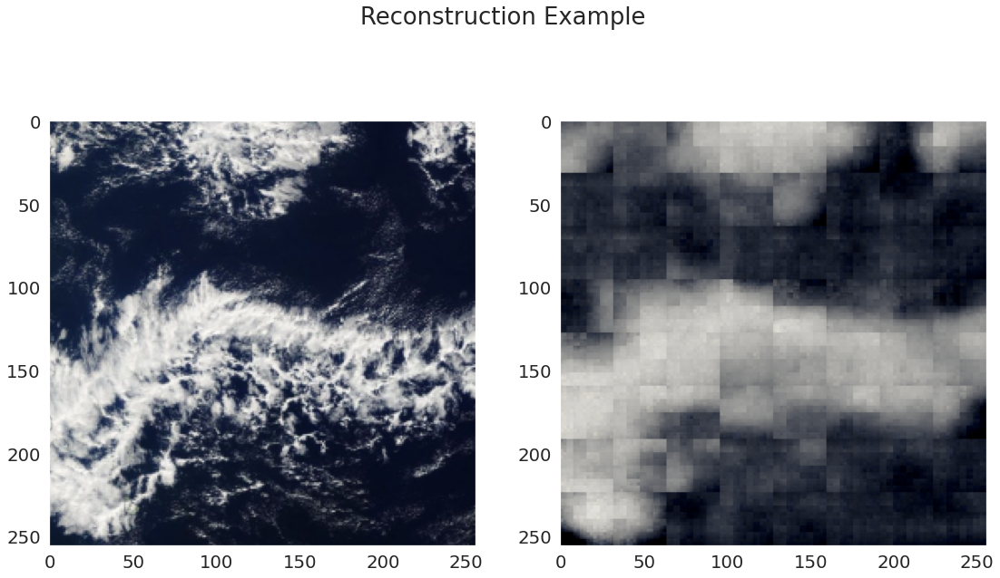

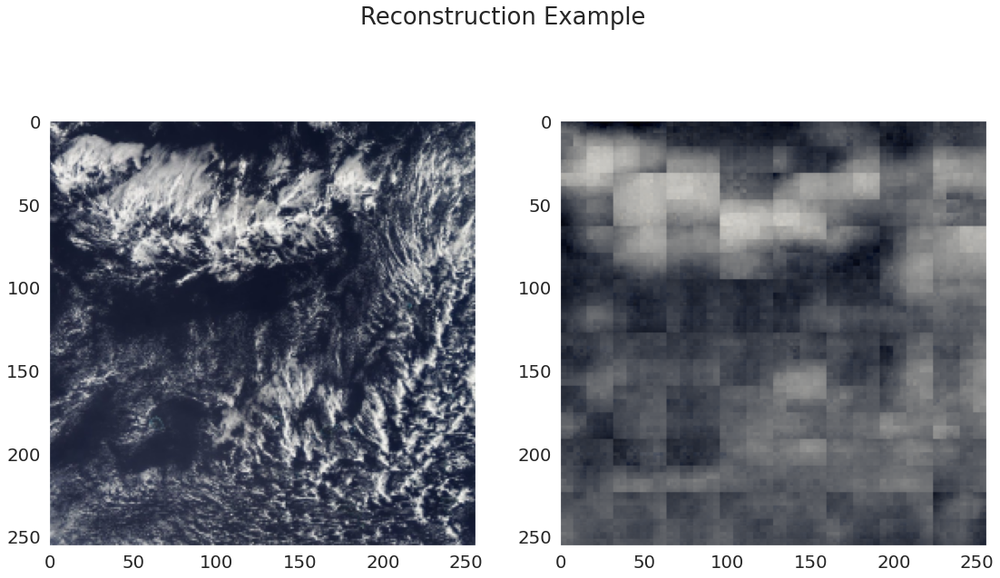

In [99]:
mypath = "/home/raysamram/DATASETS/CLUSTERING_BIGGEST_SQUARE/train"

onlyfiles = [f for f in listdir(mypath) if isfile(join(mypath, f))]
#print(onlyfiles)
w = 100
h = 100
fig = plt.figure(figsize=(50, 30))
columns = 12
rows = 5
predicted = []

#for i in range(1, columns*rows +1):
i = 0
for ex in range(5):
    index = random.choice(onlyfiles)
    img_path = mypath+"/"+index
    image = Image.open(img_path)
    x = TF.to_tensor(image).unsqueeze(0)
    #print("shape img : "+str(x.shape))
    reconstructed = model.forward(x)[0].data.numpy()
    print(reconstructed.shape)
    fig, (ax1, ax2) = plt.subplots(1, 2)
    fig.set_size_inches(18.5, 10.5)
    fig.suptitle('Reconstruction Example')    
    ax1.grid(False)
    ax1.imshow(image)
    ax2.grid(False)
    reconstructed = np.transpose(reconstructed, (1, 2, 0))
    ax2.imshow(reconstructed)
    fig.savefig('test reconstructions/test_'+str(ex)+'png', dpi=100)
print(predicted)
plt.show()